# Archetypal Analysis and Pareto Task Inference on Hepatocytes

In [1]:
import partipy as pt
import scanpy as sc
import decoupler as dc
import plotnine as pn
import pickle

from partipy.datasets import load_hepatocyte_data

First, we load the AnnData object containing 1534 hepatocytes and 10400 genes

In [2]:
adata = load_hepatocyte_data()
adata

AnnData object with n_obs × n_vars = 1534 × 10400
    obs: 'batch', 'seq_batch_ID', 'plate_coordinates', 'pool_barcode', 'cell_barcode', 'plate', 'subject'

## Preprocessing

The first step in the partipy pipeline is the preprocessing of the data. Batches that contain non-hepatocytes and genes with less than total 20 counts across all cells have already been removed. Now the data needs to be normalized:  

In [3]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

Then we find the highly variable genes (hvg):

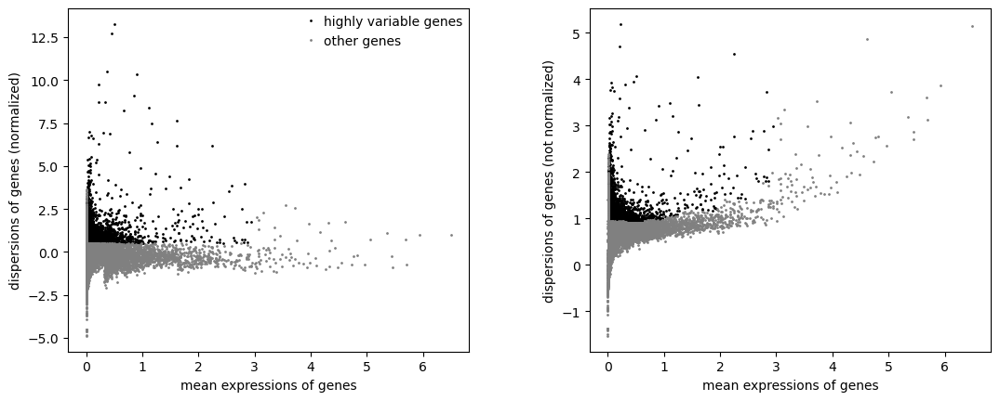

In [4]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

Lastly, the data is z-scaled and saved in a seperate layer, which is needed later for enrichment analysis.

In [5]:
adata.layers["z_scaled"]= sc.pp.scale(adata.X.copy(), max_value=10)

## Dimensionality Reduction

Based on these hvg the PCA is computed.

In [6]:
sc.pp.pca(adata, mask_var="highly_variable")

The PCA results visualized:

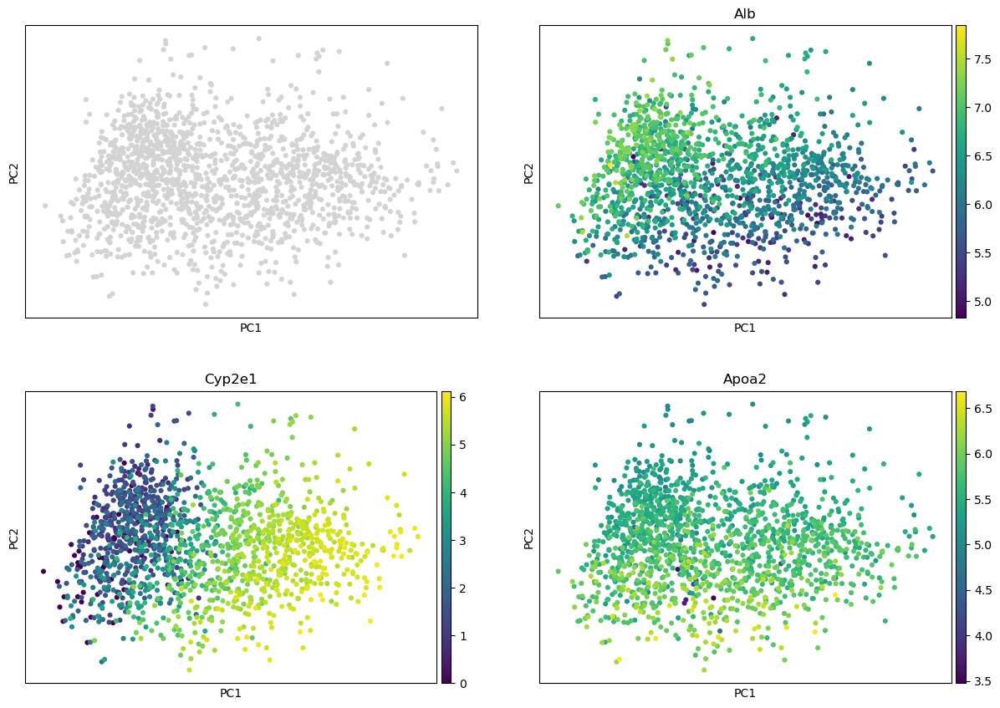

In [7]:
sc.pl.pca_scatter(adata, color=[None, "Alb", "Cyp2e1", "Apoa2"], ncols=2)

In plots two to four, the PCA is colored by the expression of genes typically associated with hepatocyte function:
- Alb: Albumin, a hallmark gene of mature hepatocytes, responsible for maintaining osmotic pressure and transporting various substances. High Alb expression is concentrated in the upper-left region, suggesting a subset of transcriptionally "classical" or functionally mature hepatocytes. [[1]](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ALB)
- Cyp2e1: A cytochrome P450 enzyme involved in drug and xenobiotic metabolism, such as ethanol and acetone. Its expression shows a gradient along PC1, likely reflecting metabolic specialization within the hepatocyte population. [[2]](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CYP2E1&keywords=Cyp2e1)
- Apoa2:  A component of HDL particles involved in lipid transport. Apoa2 is more broadly expressed, but with a mild enrichment in the lower PCA regions, indicating lipid-handling hepatocyte subsets. [[3]](https://www.genecards.org/cgi-bin/carddisp.pl?gene=APOA2&keywords=Apoa2)

These gene expression patterns highlight transcriptional diversity among hepatocytes, which we will further dissect using archetypal analysis and Pareto task inference to identify and define functional  archetypes—such as protein synthesis, xenobiotic metabolism, and lipid transport.

The variance explained by the PCA guides the selection of the number of dimensions for downstream analyses.

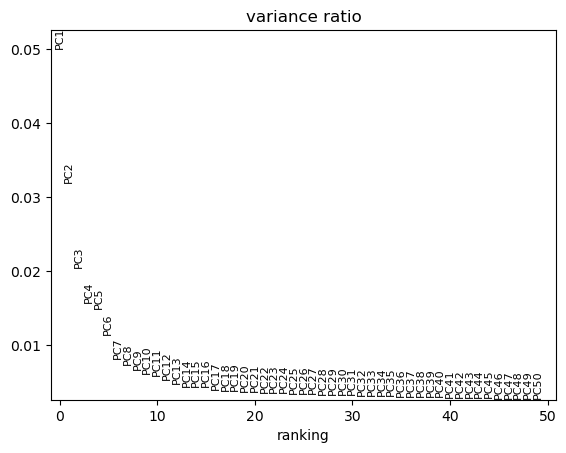

In [8]:
sc.pl.pca_variance_ratio(adata, n_pcs=50)

I choose the number of principal components (PCs) based on the point at which the explained variance begins to plateau—indicating diminishing returns from additional components. In this case, I select the first 10 PCs, as they capture the majority of variance before the curve flattens. This choice is stored as part of the archetypal analysis (AA) configuration settings in the AnnData object for downstream analyses.

In [9]:
pt.set_obsm(adata=adata, obsm_key="X_pca", n_dimensions=10)

## Select Number of Archetypes

The next step is to find out how many archetypes the polytope has. To do this, the explained variance and an information criteria (IC) are calculated for a range of archetypes (two to ten). The results show the trend of both metrics over the tested range of archetypes:

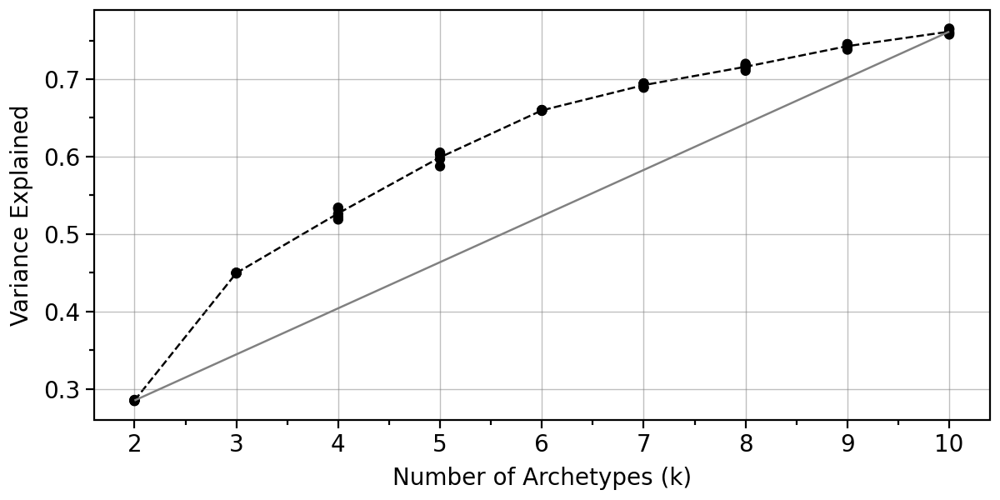

In [10]:
pt.compute_selection_metrics(adata=adata, min_k=2, max_k=10)
pt.plot_var_explained(adata)

Here we are looking for the point beyond which adding more archetypes yields minimal gains. This corresponds to the "elbow" of the curve, where the rate of increase in explained variance begins to plateau.
To assist in identifying this point, a grey reference line is plotted. The elbow is defined as the point furthest from its orthogonal projection onto this line, capturing the point of maximum curvature.

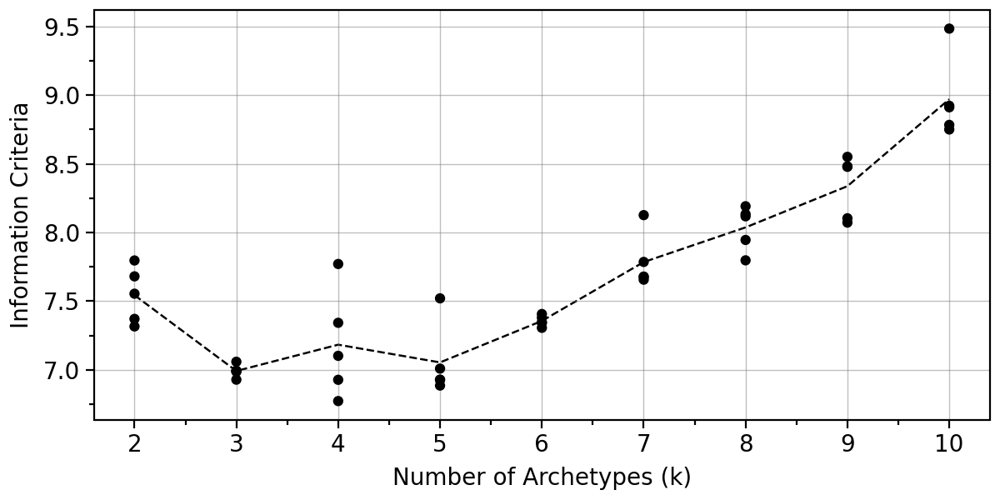

In [11]:
pt.plot_IC(adata)

Plausible candidates exhibit a low IC. Based on both the explained variance and IC analyses, the most plausible solutions involve three, four, or five archetypes.

To assess which of these represents the most robust solution, we evaluate archetype stability by performing bootstrapping with replacement on the dataset and measuring the variance of the inferred archetypes across resampled datasets.

In [12]:
pt.compute_bootstrap_variance(adata=adata, n_bootstrap=100, n_archetypes_list=range(2, 11))

There are two implemented approaches to visualizing the stability of the archetypes:
1. **Archetype Position Plots** (2D and 3D): The positions of the archetypes inferred from both the original and bootstrapped datasets are visualized in principal component space (2D and 3D). This allows to assess the spatial consistency of archetypes across resamplings—robust archetypes will cluster tightly in these plots.

In [13]:
# This cannot rendered in the GitHub preview!
pt.plot_bootstrap_3D(adata, n_archetypes=3)

2025-06-02 16:10:57 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


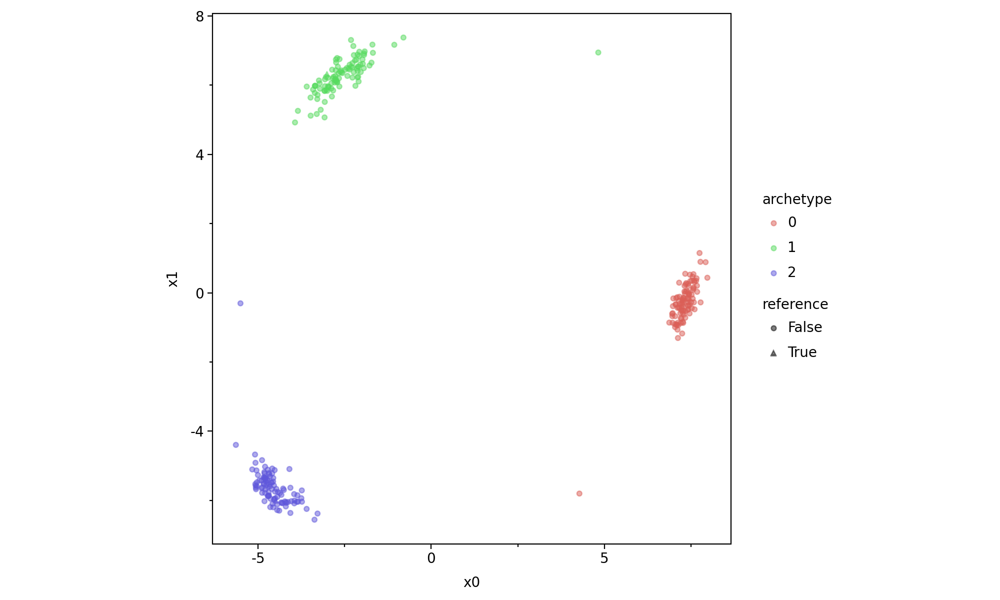

2025-06-02 16:10:57 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


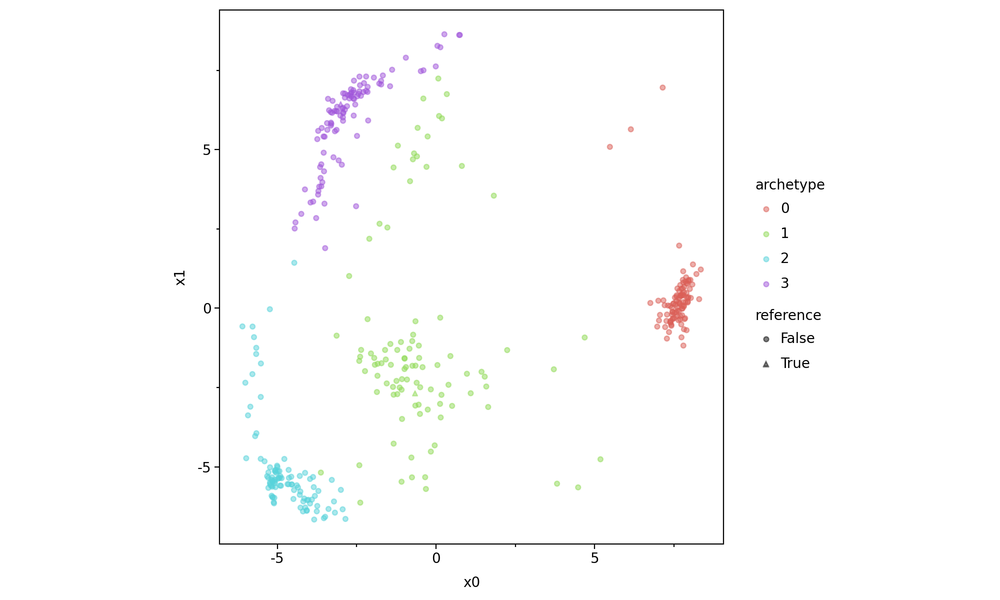

2025-06-02 16:10:57 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


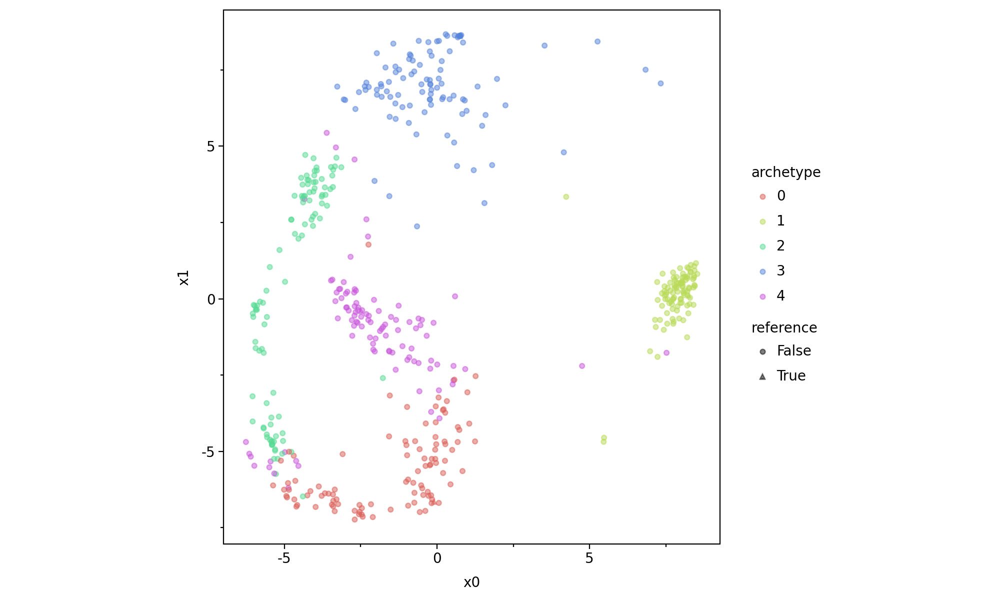

In [14]:
for i in range(3, 6):
    p = pt.plot_bootstrap_2D(adata, n_archetypes=i, alpha = 0.5) + pn.theme_matplotlib()+ pn.theme(figure_size=(10, 6))
    p.show()

2. **Variance Trend Plots**: The median and maximum positional variance of archetypes across bootstraps are plotted for each tested number of archetypes. The number of archetypes with the lowest variance indicates the most stable and robust solution, and can thus be easily identified from the plot.

2025-06-02 16:10:58 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


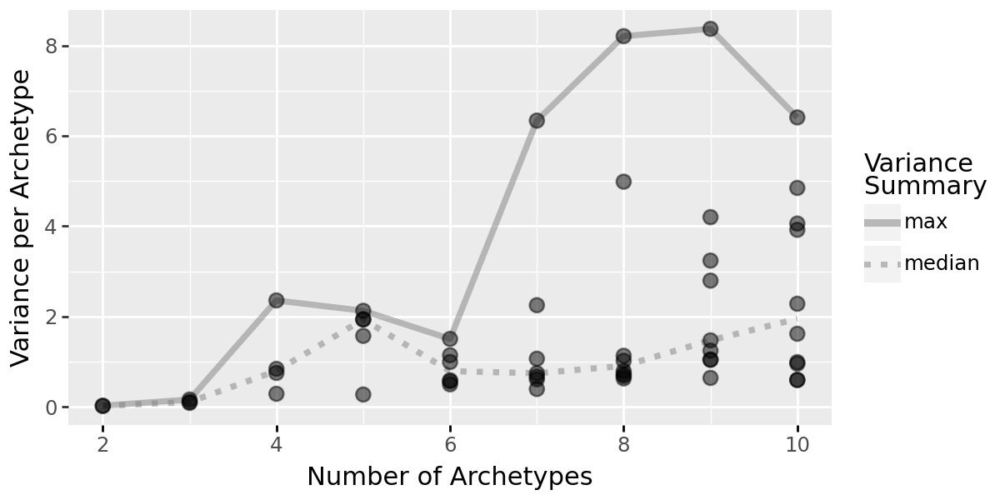

In [15]:
pt.plot_bootstrap_variance(adata)

Based on the results of the stability analysis, I select three archetypes for the AA, as this configuration demonstrated the highest robustness across bootstrapped datasets.

## Archetypal Analysis

Now that I decided on three archetypes, I can run AA and add the results to the AnnData object.

iter: 46 | RSS: 8439.372 | rel_delta_RSS: -0.000088
Algorithm converged after 46 iterations.
iter: 40 | RSS: 8451.906 | rel_delta_RSS: -0.000090
Algorithm converged after 40 iterations.
iter: 36 | RSS: 8439.610 | rel_delta_RSS: -0.000075
Algorithm converged after 36 iterations.
iter: 46 | RSS: 8441.624 | rel_delta_RSS: -0.000048
Algorithm converged after 46 iterations.
iter: 52 | RSS: 8437.199 | rel_delta_RSS: -0.000032
Algorithm converged after 52 iterations.


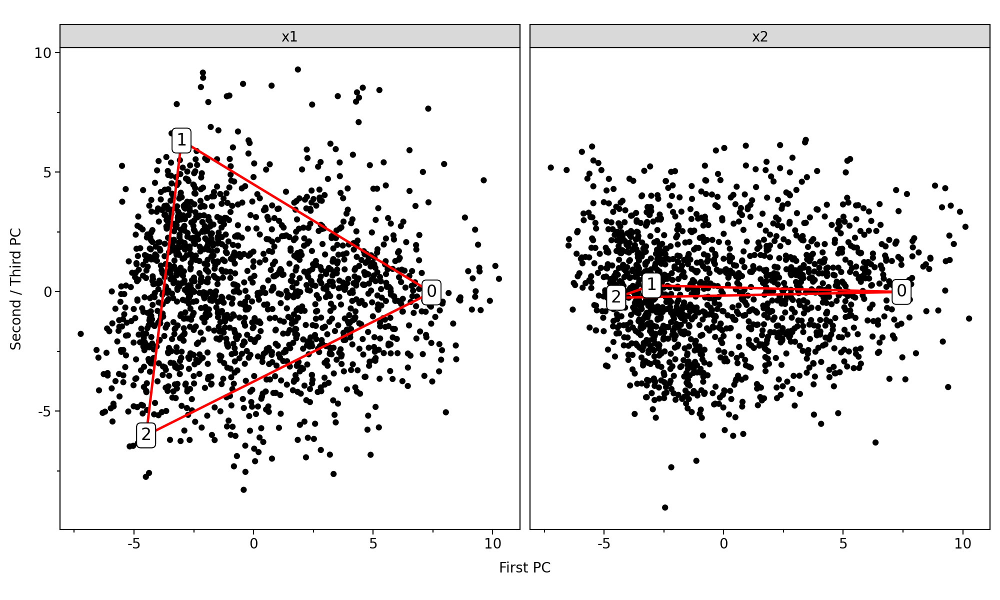

In [7]:
pt.compute_archetypes(adata, n_archetypes=3, verbose=True, archetypes_only=False)

pt.plot_archetypes_2D(adata=adata, show_two_panels =True) + pn.theme_matplotlib() + pn.theme(figure_size=(10, 6))

In [8]:
adata.uns["AA_results"]

{'A': array([[0.02577964, 0.6609569 , 0.3132634 ],
        [0.04416808, 0.64147097, 0.3143609 ],
        [0.80266106, 0.        , 0.19733877],
        ...,
        [0.90604156, 0.09395824, 0.        ],
        [0.07579849, 0.6574342 , 0.2667672 ],
        [0.27026424, 0.5212984 , 0.20843726]], dtype=float32),
 'B': array([[0.0000000e+00, 0.0000000e+00, 2.2583354e-05, ..., 7.0316985e-02,
         0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00]], dtype=float32),
 'Z': array([[ 7.441835  , -0.03500063, -0.0123297 , -0.41241118, -0.19245255,
         -0.09566946, -0.17740878,  0.06091717,  0.38082805,  0.05472476],
        [-3.0117466 ,  6.31695   ,  0.26088798, -0.03946565, -0.07146222,
          0.122251  , -0.20786843, -0.02894075,  0.05087648,  0.02399836],
        [-4.492749  , 

## Identifying representative Cells for the Archetypes  

Since the goal is to perform gene expression enrichment analysis on the archetypes, a gene expression profile is constructed for each archetype. To do this, cells are weighted according to their proximity,  using a radial basis function (RBF) kernel, to each archetype in the reduced-dimensional space. Using these weights, and the z-scored gene expression matrix, a weighted average expression is computed for each gene—yielding the representative expression profile of each archetype.

In [3]:
pt.compute_archetype_weights(adata=adata, mode="automatic")
archetype_expression = pt.compute_archetype_expression(adata=adata, layer="z_scaled")

Applied length scale is 3.734359670289714.


A look at the three genes of interest defined at the beginning of the notebook:

In [4]:
archetype_expression.loc[: ,["Alb", "Cyp2e1", "Apoa2"]]

,Alb,Cyp2e1,Apoa2
0,-0.421612,0.960646,0.186004
1,0.828617,-0.737964,-0.529355
2,-0.078433,-0.384034,0.505935


As expected, albumin is enriched at archetype 1, located in the top-left corner of the PC plot. Cyp2e1 exhibits strong representative expression at archetype 0, positioned at the far right along the PC1 axis. In contrast, Apoa2 shows a more homogeneous expression pattern, with its highest levels observed at archetype 2, which is situated at the lower region in the plot.

## Functional Enrichment of the Archetypes

After obtaining the representative gene expression profiles for each archetype, functional enrichment analysis can be performed. I will use MSigDB’s Gene Ontology (GO) Biological Processes gene sets, as these categories tend to be relatively specific and concise, facilitating the identification of meaningful enriched processes. Since the data originates from mouse, the gene symbols first need to be converted to their corresponding human orthologs before enrichment analysis.

In [29]:
geneset_to_remove = ["GOBP_HEMOSTASIS", "GOBP_PROTEIN_FOLDING_IN_ENDOPLASMIC_RETICULUM", "GOBP_LUTEINIZATION", "GOBP_PROTEIN_OXIDATION", "GOBP_NEGATIVE_REGULATION_OF_OXIDOREDUCTASE_ACTIVITY"]

msigdb_raw = dc.op.resource("MSigDB")
msigdb = msigdb_raw[msigdb_raw["collection"]=="go_biological_process"]
msigdb = msigdb[~msigdb.duplicated(["geneset", "genesymbol"])]
msigdb = msigdb[~msigdb["geneset"].isin(geneset_to_remove)].copy()
msigdb_mouse = dc.op.translate(msigdb, target_organism = "mouse")
msigdb_mouse = msigdb_mouse.drop_duplicates()
msigdb_mouse = msigdb_mouse.rename(columns={"geneset": "source", "genesymbol": "target"})

Now, I apply decoupler’s ULM method to calculate enrichment scores for the GO processes across each archetype.

In [30]:
acts_ulm_est, acts_ulm_est_p = dc.mt.ulm(data = archetype_expression,
                                          net = msigdb_mouse,
                                          verbose = True)

2025-06-05 19:49:14 | [INFO] ulm - Running ulm
2025-06-05 19:49:14 | [INFO] Extracted omics mat with 3 rows (observations) and 10400 columns (features)
2025-06-05 19:49:14 | [WARNING] 12 features of mat are empty, they will be removed
2025-06-05 19:49:14 | [WARNING] weight not found in net.columns, adding it as:
net['weight'] = 1
2025-06-05 19:49:15 | [INFO] Network adjacency matrix has 7710 unique features and 5882 unique sources
2025-06-05 19:49:15 | [INFO] ulm - fitting 5882 univariate models of 10388 observations (targets) with 10386 degrees of freedom
2025-06-05 19:49:15 | [INFO] ulm - adjusting p-values by FDR
2025-06-05 19:49:15 | [INFO] ulm - done


The estimated activity scores are stored in acts_ulm_est, and the corresponding p-values are saved in acts_ulm_est_p. The top 25 enriched and statistically significant pathways are extracted using the following approach:

In [31]:
top_processes = pt.extract_enriched_processes(est=acts_ulm_est, 
                                              pval=acts_ulm_est_p, 
                                              order="desc", 
                                              n=25, 
                                              p_threshold=0.05)

In [46]:
top_processes[2].round(2)

,Process,0,1,2,specificity
0,GOBP_NEGATIVE_REGULATION_OF_STEROL_TRANSPORT,0.81,-4.06,6.60,5.78
1,GOBP_REGULATION_OF_VERY_LOW_DENSITY_LIPOPROTEI...,-2.23,-0.78,6.59,7.37
2,GOBP_OXIDATIVE_PHOSPHORYLATION,0.69,3.36,6.35,2.98
3,GOBP_ATP_SYNTHESIS_COUPLED_ELECTRON_TRANSPORT,0.71,4.63,6.26,1.63
4,GOBP_NEGATIVE_REGULATION_OF_LIPID_CATABOLIC_PR...,-2.00,-2.39,6.25,8.25
5,GOBP_PHOSPHOLIPID_EFFLUX,-1.03,-3.37,5.86,6.88
6,GOBP_HIGH_DENSITY_LIPOPROTEIN_PARTICLE_REMODELING,-0.00,-2.61,5.52,5.53
7,GOBP_CHOLESTEROL_IMPORT,-2.37,-0.81,5.43,6.24
8,GOBP_RESPIRATORY_ELECTRON_TRANSPORT_CHAIN,0.81,5.12,5.23,0.11
9,GOBP_TRIGLYCERIDE_RICH_LIPOPROTEIN_PARTICLE_CL...,1.07,-3.29,5.14,4.07


The results are visualized in the following bar plots:

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 19:49:16 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


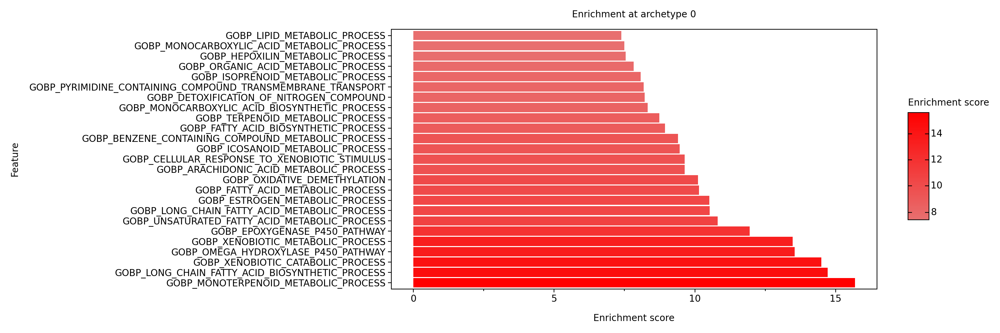

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 19:49:16 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


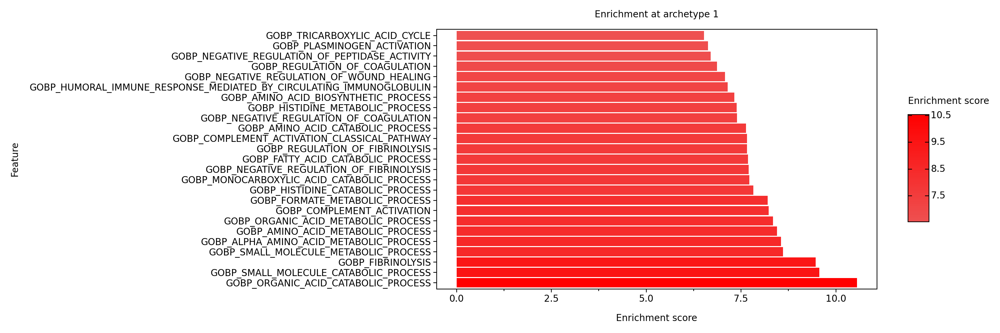

/home/hd/hd_hd/hd_fb235/.conda/envs/partipy/lib/python3.11/site-packages/IPython/lib/pretty.py:794: FutureWarning: Using repr(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().
2025-06-05 19:49:16 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


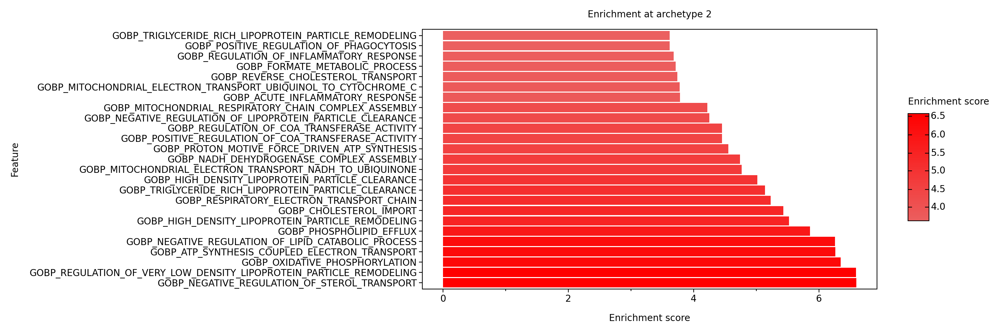

[<Figure Size: (1500 x 500)>,
 <Figure Size: (1500 x 500)>,
 <Figure Size: (1500 x 500)>]

In [32]:
pt.barplot_functional_enrichment(top_processes, show=False)

Instead of selecting the top 25 most enriched GO processes, i can additionally extract and plot those with the highest specificity scores, highlighting pathways most uniquely associated with each archetype.

In [ ]:
specific_processes = pt.extract_specific_processes(est=acts_ulm_est,
                                                   pval=acts_ulm_est_p, 
                                                   n=10,
                                                   p_threshold=0.05)

2025-06-05 19:49:17 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


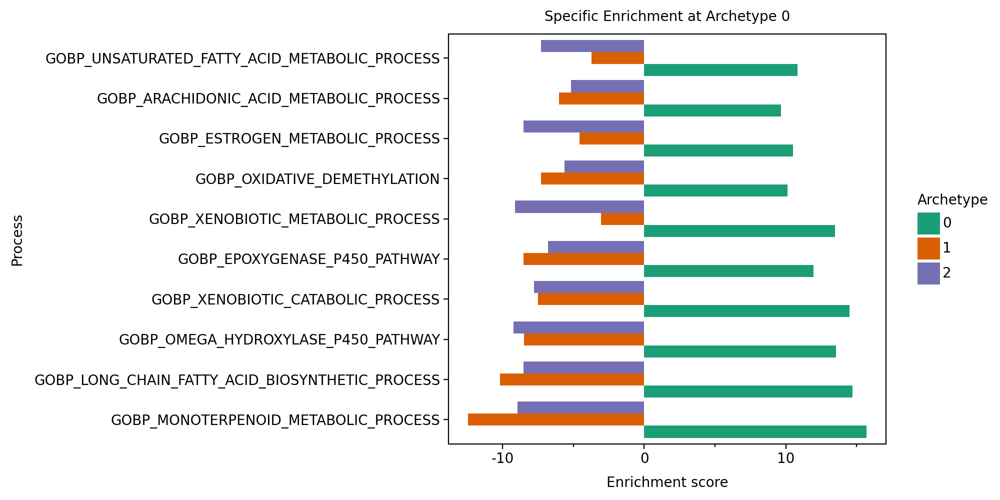

2025-06-05 19:49:17 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


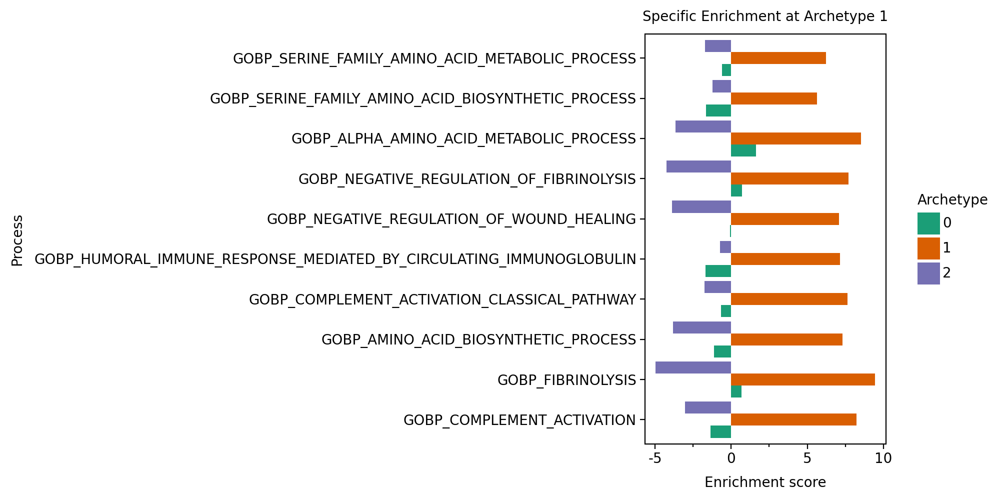

2025-06-05 19:49:17 | [INFO] Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


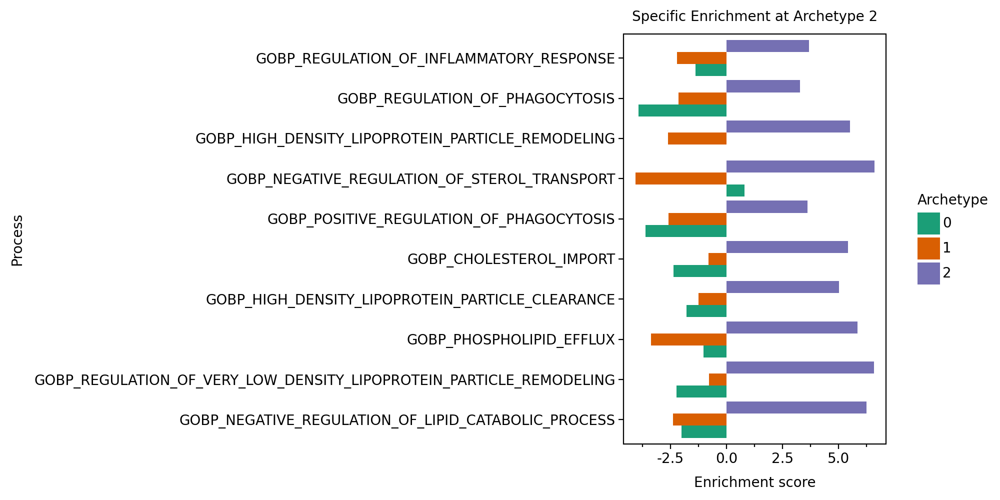

In [34]:
for a in range(0,3):
    p = pt.barplot_enrichment_comparison(specific_processes[a]) + pn.ggtitle(f"Specific Enrichment at Archetype {a}")
    p.show()

The plots show that the three identified hepatocyte archetypes exhibit distinct functional specializations.
- **Archetype 0** is characterized by strong enrichment of xenobiotic and lipid metabolic processes, including cytochrome P450 pathways such as the omega hydroxylase and epoxygenase P450 pathways. This archetype aligns with hepatocytes specialized in detoxification and fatty acid metabolism. The high expression of Cyp2e1, a key enzyme involved in drug metabolism and biotransformation, further supports this functional identity.

- **Archetype 1** is characterized by enrichment in amino acid catabolism, organic acid metabolism, fatty acid β-oxidation, and several blood coagulation-related processes, including fibrinolysis and protein activation cascades. These functions align with a hepatocyte subtype heavily involved in nutrient metabolism and the synthesis of plasma components. The strong expression of Alb (albumin) — a hallmark liver protein with carrier functions and indirect roles in coagulation — further supports this archetype as representing biosynthetically active hepatocytes involved in systemic homeostasis and hemostatic regulation.

- **Archetype 2** shows pronounced enrichment in mitochondrial energy metabolism pathways, including oxidative phosphorylation and the electron transport chain, alongside immune and inflammatory response processes. This suggests a subset of hepatocytes with elevated energy demands and roles in hepatic immune functions.Furthermore, it features pathways related to HDL remodeling, and cholesterol import. These processes are critical for lipoprotein metabolism and cholesterol homeostasis. This functional profile aligns well with high expression of Apoa2, a key component of HDL particles.

Leading genes for specifically enriched pathways:


In [ ]:
df = archetype_expression.T.copy()
df.columns = df.columns.astype(str)
leading_genes_arch = {}

for arch_ind in range(0, 3):
    leading_genes_arch[arch_ind] = []
    for process_name in specific_processes[arch_ind]["Process"][:3]:
        _, le = dc.pl.leading_edge(
            df=df,
            net=msigdb_mouse,
            stat=str(arch_ind),
            name = process_name
        )
        leading_genes_arch[arch_ind].append((process_name, le))

In [33]:
leading_genes_arch

{0: [('GOBP_MONOTERPENOID_METABOLIC_PROCESS',
   array(['Cyp2e1', 'Cyp1a2', 'Cyp2c37', 'Cyp2c50', 'Cyp2c38'], dtype='<U18')),
  ('GOBP_LONG_CHAIN_FATTY_ACID_BIOSYNTHETIC_PROCESS',
   array(['Cyp2c29', 'Cyp2e1', 'Cyp1a2', 'Cyp2c37', 'Cyp2c50', 'Gstm6',
          'Gstm2', 'Gstm1', 'Gstm3', 'Cyp2c38'], dtype='<U18')),
  ('GOBP_OMEGA_HYDROXYLASE_P450_PATHWAY',
   array(['Cyp2c29', 'Cyp1a2', 'Cyp2c37', 'Cyp2c50', 'Cyp2c38', 'Cyp4f14'],
         dtype='<U18'))],
 1: [('GOBP_COMPLEMENT_ACTIVATION',
   array(['Mug2', 'Mug1', 'Cfi', 'Hc', 'C4bp', 'C8a', 'C9', 'C8g', 'Cfb',
          'Serping1', 'Mbl2', 'C2', 'C8b', 'C3', 'Clu', 'C1rl', 'Cr1l',
          'Cfh', 'C1qbp'], dtype='<U18')),
  ('GOBP_FIBRINOLYSIS',
   array(['Cpb2', 'Fgg', 'Vtn', 'Apoh', 'Klkb1', 'Serpinf2', 'Fgb', 'Fga',
          'Plg', 'F2', 'Serping1', 'Hrg'], dtype='<U18')),
  ('GOBP_AMINO_ACID_BIOSYNTHETIC_PROCESS',
   array(['Cps1', 'Sds', 'Sephs2', 'Pah', 'Bhmt', 'Got1', 'Cth', 'Aldh1a7',
          'Agxt', 'Sdsl', 'Cbs', 'Dpy